In [ ]:
# Import necessary libraries
from keras.models import load_model

In [ ]:
# Load the pre-trained model
model = load_model('./dog_cat_class.keras')

In [4]:
# Display the model summary
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 74, 74, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_9 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_9 (MaxPoolin  (None, 36, 36, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_10 (Conv2D)          (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 17, 17, 128)      

In [5]:
# Load and preprocess an image for visualization
img_path = './dog_cats_small/test/dogs/dog.1700.jpg'

from keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.

print(img_tensor.shape)

(1, 150, 150, 3)


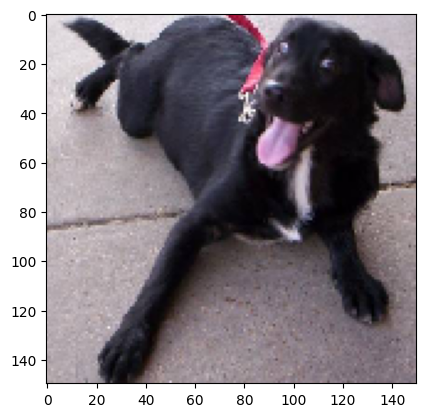

In [6]:
import matplotlib.pyplot as plt

# Display the image
plt.imshow(img_tensor[0])
plt.show()

In [7]:
from keras import models

# Create an activation model for visualization
layer_outputs = [layer.output for layer in model.layers[:8]]
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

In [ ]:
# Predict and visualize the activations
activations = activation_model.predict(img_tensor)

In [9]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 148, 148, 32)


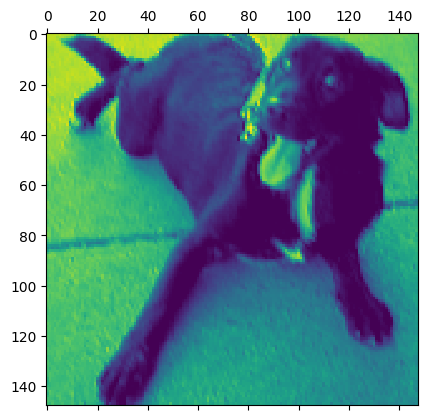

In [44]:
# Visualize activations for different channels
plt.matshow(first_layer_activation[0, :, :, 1], cmap='viridis')

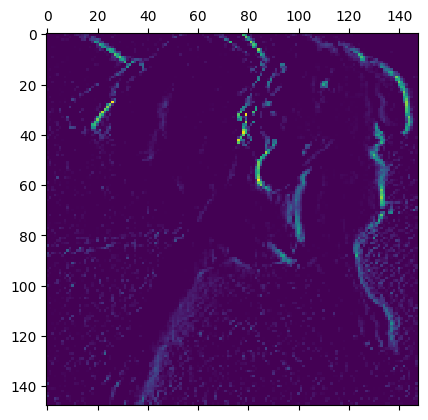

In [41]:
plt.matshow(first_layer_activation[0, :, :, 8], cmap='viridis')

/tmp/ipykernel_41894/2767390185.py:17: RuntimeWarning: invalid value encountered in divide
  channel_image /= channel_image.std()
/tmp/ipykernel_41894/2767390185.py:20: RuntimeWarning: invalid value encountered in cast
  channel_image = np.clip(channel_image, 0, 255).astype('uint8')


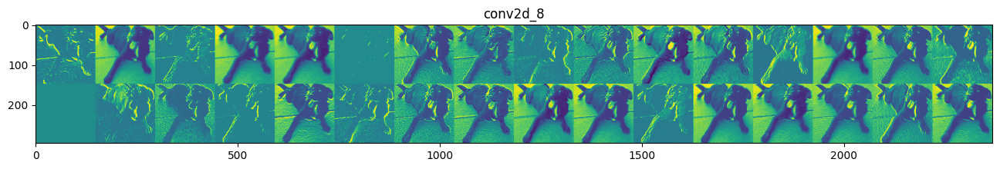

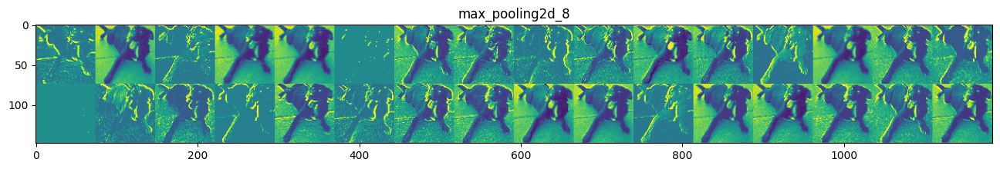

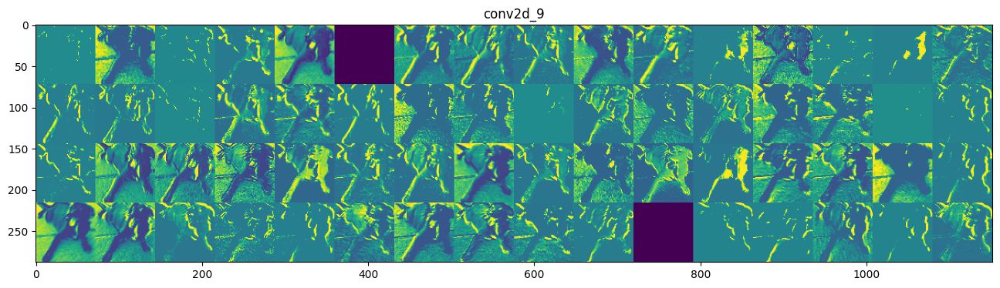

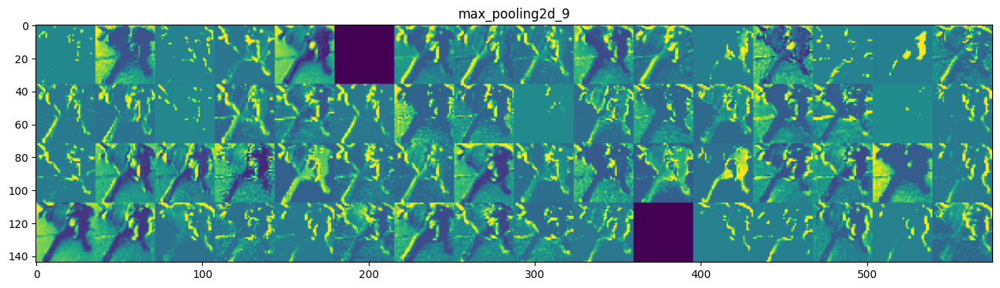

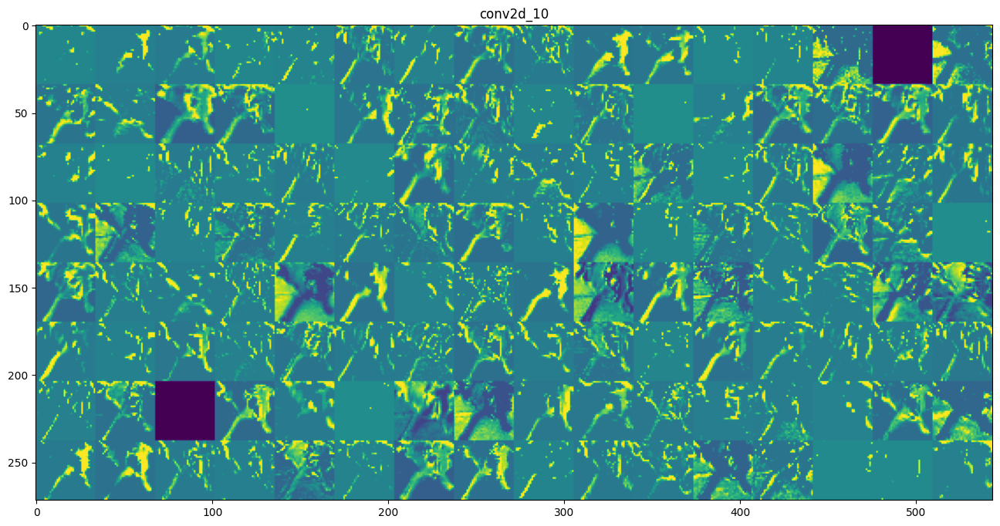

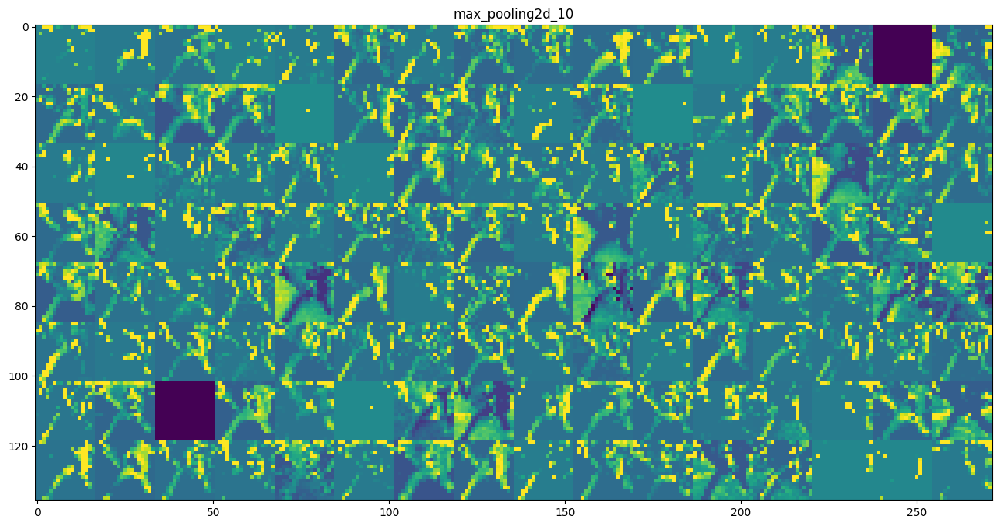

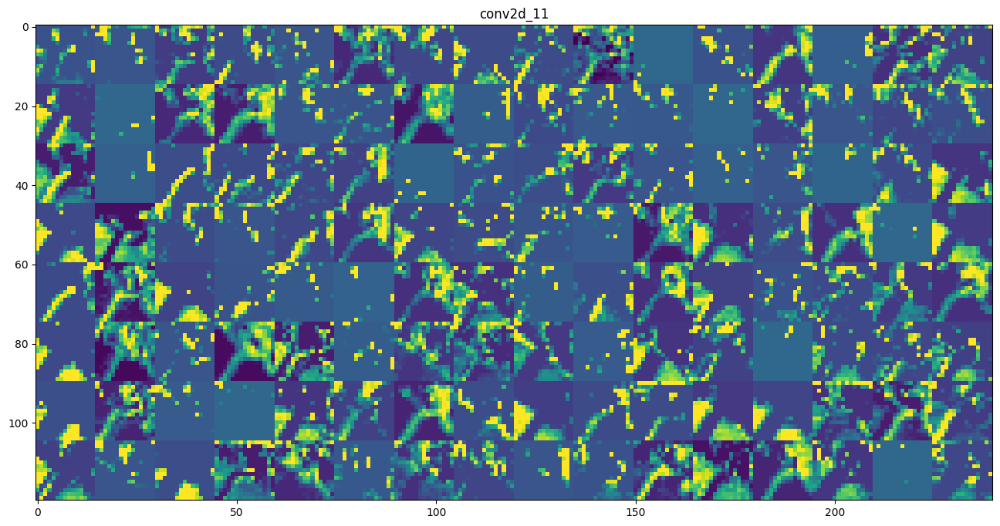

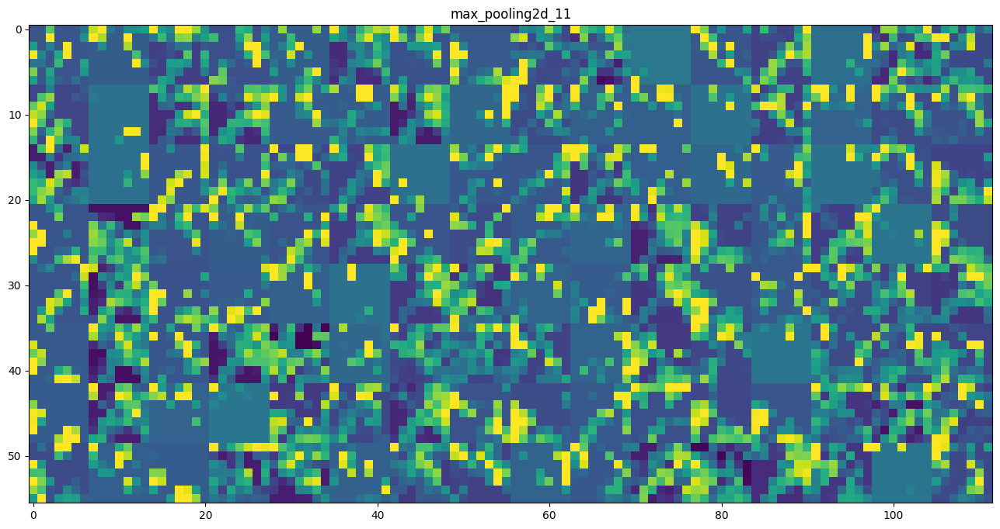

In [45]:
# Get layer names for visualization
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

# Visualize activations for each layer
for layer_name, layer_activation in zip (layer_names, activations):
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))
    
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0, :, :, col * images_per_row + row]
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image
            
    scale = 1./size
    plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, cmap='viridis', aspect='auto')

In [139]:
from keras.applications import VGG16
import keras.backend as K
import tensorflow as tf

# Visualize patterns generated in filter activations
tf.compat.v1.disable_eager_execution()

model = VGG16(weights='imagenet', include_top=False)
layer_name = 'block4_conv1'
filter_index = 0

2023-12-20 19:51:38.029446: W tensorflow/c/c_api.cc:305] Operation '{name:'block4_conv3_6/bias/Assign' id:21091 op device:{requested: '', assigned: ''} def:{{{node block4_conv3_6/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](block4_conv3_6/bias, block4_conv3_6/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


In [140]:
# Define helper functions for deprocessing and generating patterns
def deprocess_image(x):
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1
    x += 0.5
    x = np.clip(x, 0, 1)
    x *= 255
    x = np.clip(x, 0, 255).astype(np.uint8)
    return x

In [141]:
def generate_pattern(layer_name, filter_index, size=150):
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])
    grads = K.gradients(loss, model.input)[0]
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)
    iterate = K.function([model.input], [loss, grads])
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * 1.
    img = input_img_data[0]
    return deprocess_image(img)

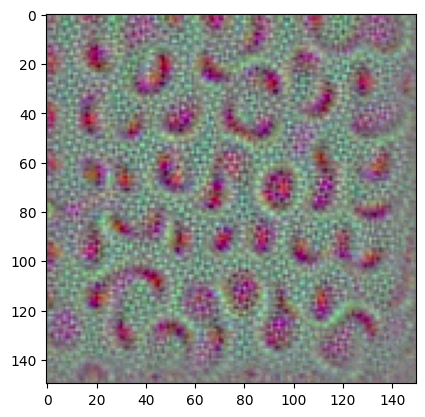

In [142]:
# Visualize a pattern generated
plt.imshow(generate_pattern(layer_name, filter_index))

In [143]:
layer_name = 'block1_conv1'
size = 64
margin = 5

results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3))

In [144]:
# Generate a grid of patterns for each filter in the specified layer
for i in range(8):
    for j in range(8):
        filter_image = generate_pattern(layer_name, i + (j * 8), size=size)
        
        horizontal_start = i * size + i * margin
        horizontal_end = horizontal_start + size
        vertical_start = j * size + j * margin
        vertical_end = vertical_start + size
        results[horizontal_start:horizontal_end, vertical_start:vertical_end, :] = filter_image

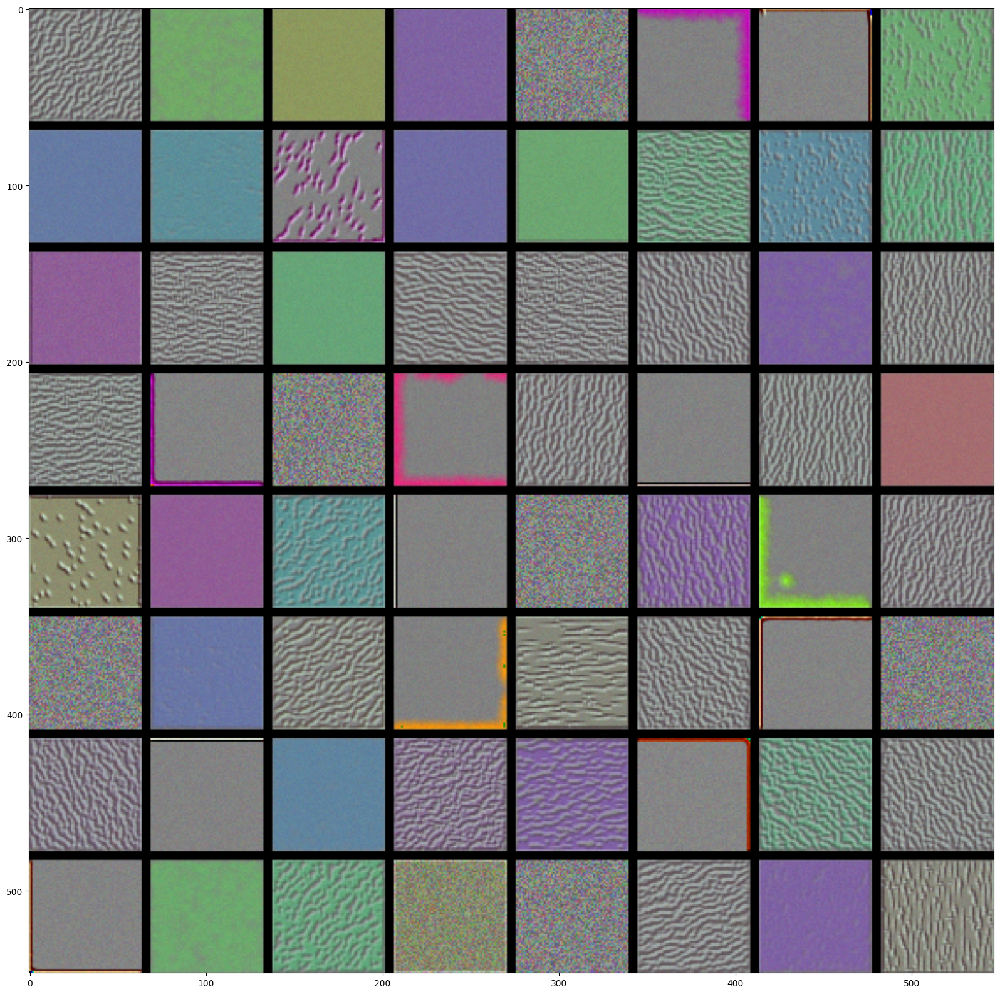

In [135]:
# Display the grid of generated patterns
plt.figure(figsize=(20, 20))
plt.imshow(results)

In [146]:
model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

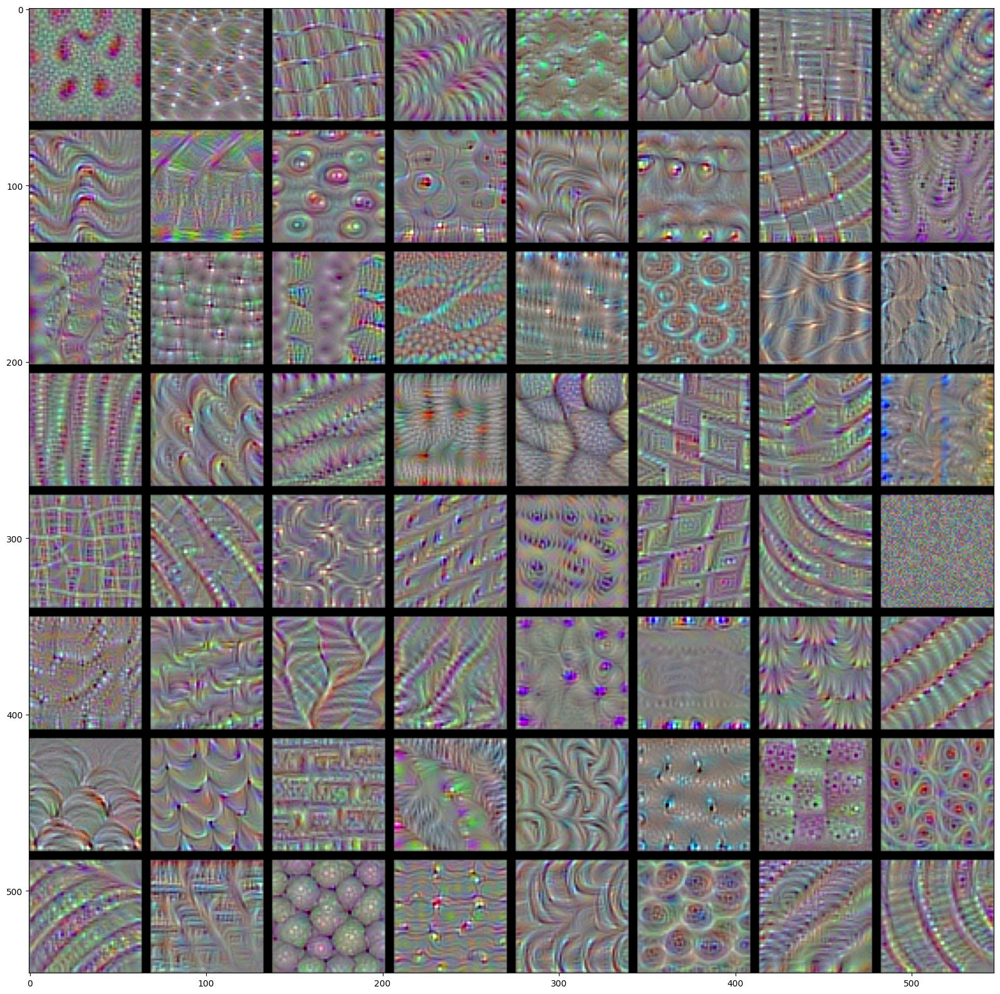

In [150]:
layer_name = 'block4_conv1'
size = 64
margin = 5

results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3))
for i in range(8):
    for j in range(8):
        filter_image = generate_pattern(layer_name, i + (j * 8), size=size)

        horizontal_start = i * size + i * margin
        horizontal_end = horizontal_start + size
        vertical_start = j * size + j * margin
        vertical_end = vertical_start + size
        results[horizontal_start:horizontal_end, vertical_start:vertical_end, :] = filter_image
plt.figure(figsize=(20, 20))
plt.imshow(results.astype(np.uint8))

In [153]:
from keras.applications.vgg16 import VGG16

# Load the VGG16 model with pre-trained weights
model = VGG16(weights='imagenet')

553467096/553467096 [==============================] - 28s 0us/step


2023-12-20 20:26:01.505635: W tensorflow/c/c_api.cc:305] Operation '{name:'block1_conv2_7/bias/Assign' id:50073 op device:{requested: '', assigned: ''} def:{{{node block1_conv2_7/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](block1_conv2_7/bias, block1_conv2_7/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


In [151]:
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input, decode_predictions

# Visualize the image

img_path = './African_Bush_Elephant.jpg'
img = image.load_img(img_path, target_size=(224, 224))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

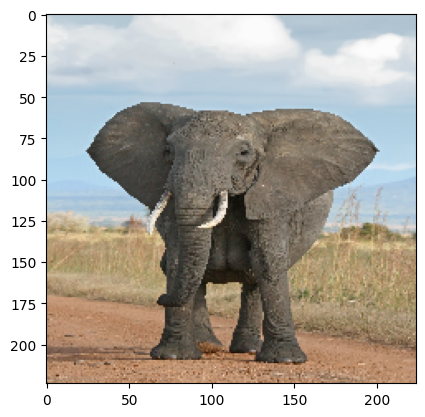

In [154]:
plt.imshow(img)
plt.show()

In [155]:
# Predict the class labels and decode predictions
preds = model.predict(x)
print(decode_predictions(preds, top=3)[0])

2023-12-20 20:26:30.606871: W tensorflow/c/c_api.cc:305] Operation '{name:'predictions/Softmax' id:50428 op device:{requested: '', assigned: ''} def:{{{node predictions/Softmax}} = Softmax[T=DT_FLOAT, _has_manual_control_dependencies=true](predictions/BiasAdd)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2023-12-20 20:26:31.568400: W tensorflow/compiler/mlir/tools/kernel_gen/transforms/gpu_kernel_to_blob_pass.cc:191] Failed to compile generated PTX with ptxas. Falling back to compilation by driver.


35363/35363 [==============================] - 0s 0us/step
[('n02504458', 'African_elephant', 0.85183465), ('n01871265', 'tusker', 0.13986284), ('n02504013', 'Indian_elephant', 0.00822741)]


In [156]:
# Display the index of the predicted class label
np.argmax(preds[0])

386

In [160]:
# Specify the output layer and compute the gradients
elephant_output = model.output[:, 386]
last_conv_layer = model.get_layer(name='block5_conv3')
grads = K.gradients(elephant_output, last_conv_layer.output)[0]
pooled_grads = K.mean(grads, axis=(0, 1, 2))

# Define a function to compute the gradient values and convolved features
iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])
pooled_grads_value, conv_layer_output_value = iterate([x])
# Multiply each channel in the feature map array by the gradient value
for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]
    
# Compute the heatmap by averaging over all channels
heatmap = np.mean(conv_layer_output_value, axis=-1)

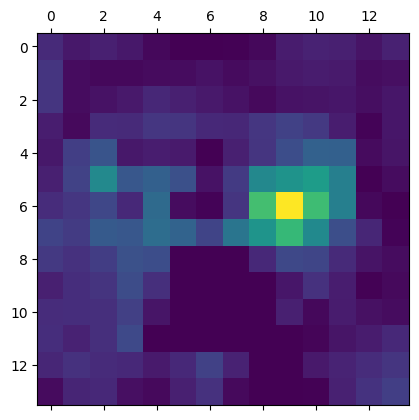

In [161]:
# Normalize the heatmap
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
# Display the heatmap
plt.matshow(heatmap)

In [164]:
import cv2

# Apply the heatmap on the original image
img = cv2.imread(img_path)
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
superimposed_img = heatmap * 0.4 + img

True

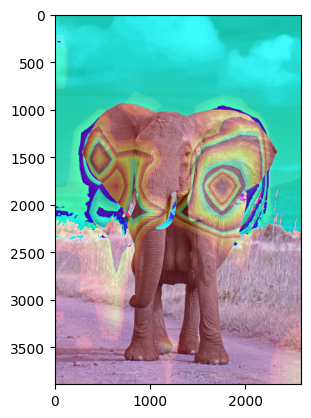

In [167]:
# Display the superimposed image
plt.imshow(superimposed_img.astype(np.uint8))